### Script for exploratory investigation of traces, demonstrating how to load data into CosmosTraces object. 
This script does not produce any final figures. 

To run locally, download processed imaging and behavior datasets, and change directory in second cell to specify the file location. 


In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline
%load_ext line_profiler

import os
from matplotlib import pyplot as plt
import numpy as np
import time
import scipy.stats

import h5py
from scipy.ndimage.filters import gaussian_filter1d

from cosmos.behavior.bpod_dataset import BpodDataset
from cosmos.traces.cosmos_traces import CosmosTraces
import cosmos.params.trace_analyze_params as params 
import cosmos.traces.trace_analysis_utils as utils

# import cosmos.imaging.atlas_registration as reg
# from cosmos.traces.cell_plotter import CellPlotter



/home/user/anaconda3/envs/cosmostools3/lib/python3.6/site-packages/h5py/__init__.py:34: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
# Select dataset.

# Specify data location here.
data_dir = '/home/user/Dropbox/cosmos_data/'  # Top level, should contain separate directories for each date.
behavior_dir = '/home/user/Dropbox/cosmos_data/behavior/'
fig_save_dir = '/home/user/Dropbox/cosmos/demo/'

# Set dataset ID here.
dataset_id = 11  # IDs of provided datasets: 7, 11, 18, 19.


# Boiler plate (don't change)
dataset = params.DATASETS[dataset_id]
print(dataset)
dataset['data_root'] = data_dir
dataset['fig_save_dir'] = fig_save_dir
dataset['behavior_dir'] = behavior_dir
os.makedirs(fig_save_dir, exist_ok=True)

{'date': '20180420', 'name': 'cux2ai148m943_COSMOSTrainMultiBlockGNG_1', 'bpod_file': 'cux2m943/COSMOSTrainMultiBlockGNG/Session Data/cux2m943_COSMOSTrainMultiBlockGNG_20180420_130634.mat', 'regressors_name': 'cux2m943-20180420-130639', 'info': '***This has good behavior. 1084 sources'}


(1/3) Loading trace data.
(2/3) Loading behavior data.
While loading bpod, enforcing that ntrials is:194
lick rates bin size: 0.034
lick rates bin size: 0.034
lick rates bin size: 0.034
lick rates bin size: 0.034
Saving to:  /home/user/Dropbox/cosmos/demo/20180420/cux2ai148m943_COSMOSTrainMultiBlockGNG_1/polar_pre-reward.pdf
Saving to:  /home/user/Dropbox/cosmos/demo/20180420/cux2ai148m943_COSMOSTrainMultiBlockGNG_1/polar_post-reward.pdf
Saving to:  /home/user/Dropbox/cosmos/demo/20180420/cux2ai148m943_COSMOSTrainMultiBlockGNG_1/licks.pdf
Saving to:  /home/user/Dropbox/cosmos/demo/20180420/cux2ai148m943_COSMOSTrainMultiBlockGNG_1/success_rate.pdf
LED trials: 195
Processing traces.
[ -0.98693836 480.98693836]
[346.31439921 364.68560079]
Elapsed time: 18.12649631500244


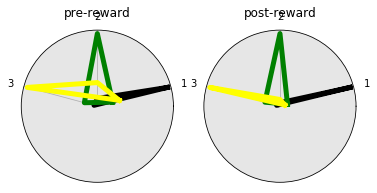

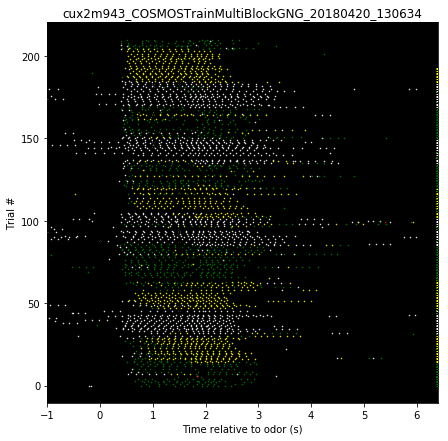

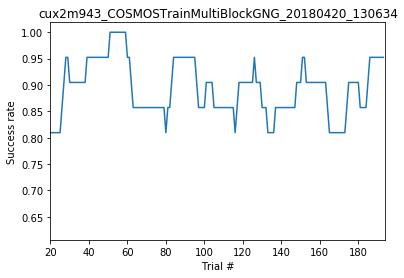

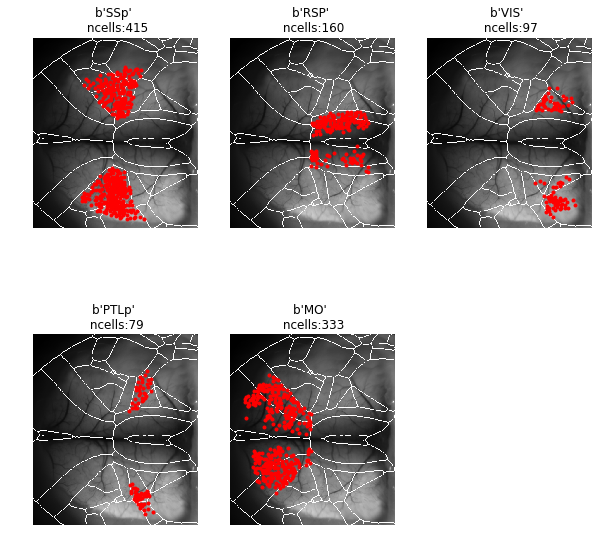

In [3]:
# Load data.
t0 = time.time()

CT = CosmosTraces(dataset, do_region_plots=True)
BD = CT.bd # BpodDataset object containing information about task behavior

print('Elapsed time: '+str(time.time() - t0))

In [4]:
# Compute session performance.
print('Session performance: {:.3f}'.format(np.sum(CT.bd.success)/len(CT.bd.success)))

Session performance: 0.892


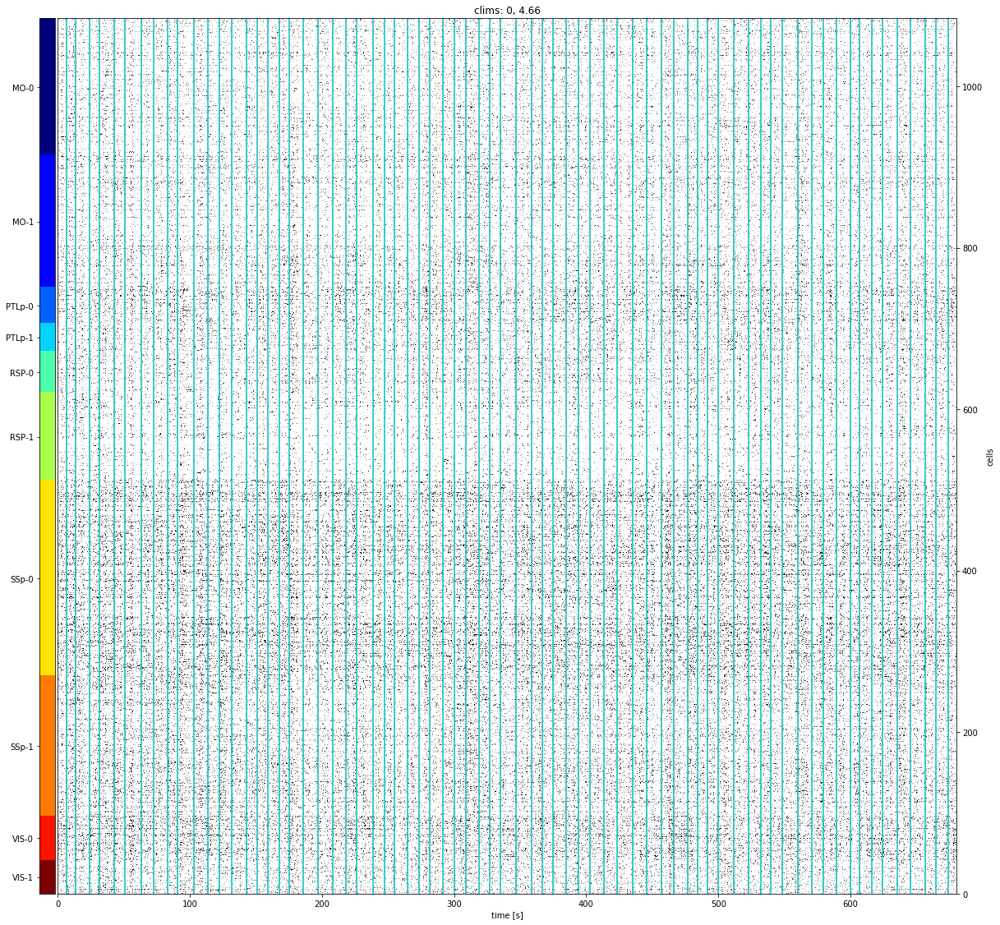

In [5]:
# Plot raster of neural activity, organized by region.
CT.plot_raster_by_region(traces=gaussian_filter1d(CT.S, 2, axis=1), 
                         startframe=0, 
                         nframes=20000, 
                         event_frames=CT.led_frames)
plt.savefig(os.path.join(CT.fig_save_path, 'raster_zoom1.pdf'), 
            transparent=True, rasterized=True, dpi=600)

---Plotting contours: 3.326500177383423 seconds ---


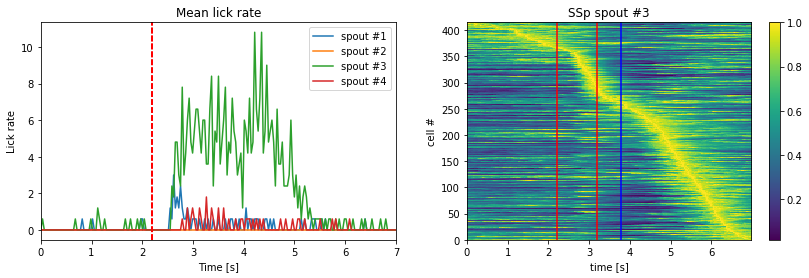

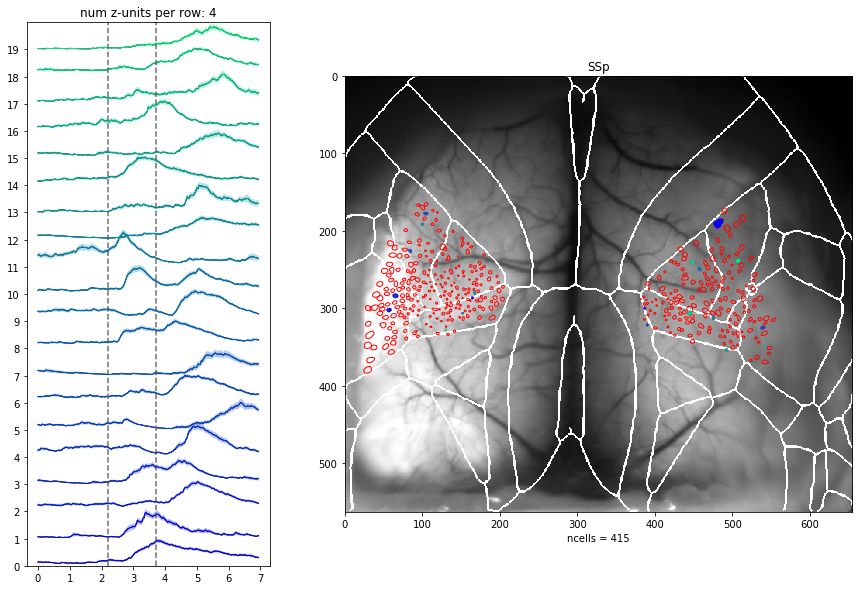

In [6]:
# Make general summary plots for specified cells and trials. 

# Plot footprints and traces cells from a region.
region = 'SSp' # Options are: 'VIS', 'RSP', 'MO', 'PTLp', 'SSp'
hemisphere = None # 0, 1, or None
spout_num = 3 # Options are 1, 3, 4 (Originally, there were 4, not 3, spouts.)
use_all_cells = False # If True, then ignores region selections. 

# Select cells to be plotted.
which_cells = np.array(CT.cells_in_region[CT.regions[region]])
if hemisphere is not None:
    which_cells = which_cells[np.where(
        CT.hemisphere_of_cell[which_cells]==hemisphere)[0]]
if use_all_cells:
    which_cells = np.arange(np.shape(CT.Ct)[0])

# Select trials to be plotted. 
trials = np.logical_and.reduce((BD.go_trials.astype('bool'), 
                                            BD.success, 
                                            BD.spout_positions==spout_num))

# Generate trial averages for specified trials and cells.
trials = trials[:CT.Ct.shape[2]]
traces = CT.Ct[which_cells,:,:][:,:,trials[:]]
footprints = CT.footprints[:,:,which_cells]
trial_means = np.mean(traces, axis=2)
trial_sems = scipy.stats.sem(traces, axis=2)


# Make plots.
plt.figure(figsize=(14,4))
BD.plot_mean_lick_rates(trials, ax=plt.subplot('121'), xlims=[0, 7])
utils.plot_average_trial_raster(trial_means, 
                                bpod_data=CT.bd, 
                                ordering='peak', # Note: not cross-validated.
                                do_normalize=True, 
                                dt = CT.dt,
                                ax=plt.subplot('122'), 
                                title=region+' spout #'+str(spout_num))
CT.plot_variance_shaded_traces(trial_means, trial_sems, 
                               cell_inds=np.arange(10, 30), # Set this
                               footprints=footprints,
                               ordering='var', 
                               title=region) 
plt.savefig(os.path.join(CT.fig_save_path, 'overview.pdf'), 
            transparent=True, rasterized=True, dpi=600)


In [7]:
# Define trial types.
use_all_trials = True # Set to False to only use trials with high lick-selectivity

if use_all_trials:
    clean_trials = np.ones(BD.success.shape)
    min_block_trial = 0
else:
    clean_trials = np.zeros(BD.success.shape)
    clean_trials[BD.get_clean_trials(min_selectivity=0.95)] = 1
    min_block_trial = 7

lick_spout1 = np.logical_and.reduce((BD.go_trials.astype('bool'), 
                                     BD.success, 
                                     BD.spout_positions==1,
                                     BD.ind_within_block>=min_block_trial,
                                     clean_trials))
lick_spout3 = np.logical_and.reduce((BD.go_trials.astype('bool'), 
                                     BD.success, 
                                     BD.spout_positions==3,
                                     BD.ind_within_block>=min_block_trial, 
                                     clean_trials))
lick_spout4 = np.logical_and.reduce((BD.go_trials.astype('bool'), 
                                     BD.success, 
                                     BD.spout_positions==4,
                                     BD.ind_within_block>=min_block_trial, 
                                     clean_trials))
nolick = np.logical_and.reduce((~BD.go_trials.astype('bool'), 
                                BD.success))

trial_sets = (lick_spout1, lick_spout3, lick_spout4, nolick)

In [8]:
### Get event frames (i.e. trial start, odor onset, reward onset)
event_frames = CT.fps*np.array([0, BD.stimulus_times[0], 
                             BD.stimulus_times[0]+1.5])


In [17]:
# Generate videos where each cell is represented by a circle centered on the centroid
# of its ROI, and the size/alpha/color correspond to its activity.

do_generate_centroid_videos = False
do_test_visual_stim = False # Set true when using m72_vis_stim_2

if do_generate_centroid_videos:
    if do_test_visual_stim:
        ### Testing out centroid_movie with visual stim
        rates = gaussian_filter1d(CT.St, 1.5, axis=1, mode='constant')
        mean_vid = np.mean(rates[:,:,:], axis=2)

        mean_vid = scipy.stats.zscore(mean_vid, axis=1)
        save_dir = os.path.join(fig_save_dir, 'mean_vids', 'vis')
        if not os.path.isdir(save_dir):
            os.makedirs(save_dir)
        utils.centroid_movie(mean_vid, np.arange(mean_vid.shape[0]), CT.centroids, CT.atlas_tform, max_radius=500,
                              save_dir=save_dir, do_square=False)   

    else:
        trial_types = (lick_spout1, lick_spout3, lick_spout4)
        trial_names = ['spout1', 'spout3', 'spout4']

        rates = gaussian_filter1d(CT.St, 1.5, axis=1, mode='constant')

        for ind, trials in enumerate(trial_types):
            save_dir = os.path.join(fig_save_dir, 'mean_vids', str(dataset_id), trial_names[ind])
            if not os.path.isdir(save_dir):
                os.makedirs(save_dir)

            mean_vid = np.mean(rates[:,:,trials], axis=2)
            mean_vid = scipy.stats.zscore(mean_vid, axis=1)
            title_list = ['BASELINE']*int(np.floor(CT.event_frames[1]))
            title_list.extend(['ODOR']*30)
            title_list.extend(['']*15)
            title_list.extend(['REWARD']*30)
            title_list.extend(['']*(mean_vid.shape[1]-len(title_list)))
            utils.centroid_movie(mean_vid, np.arange(mean_vid.shape[0]), CT.centroids, CT.atlas_tform, max_radius=50,
                                 save_dir=save_dir, title_list=title_list)

In [10]:
# Get smoothed spikes.
smooth_stdev = 1.5
smooth_spikes = gaussian_filter1d(CT.St, smooth_stdev, axis=1, mode='constant')

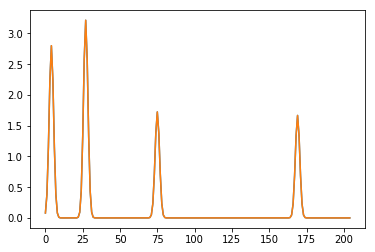

In [11]:
### Set rates here (i.e. could use fluorescence or spikes)

rates = smooth_spikes
rates_flat = np.reshape(rates, (rates.shape[0], rates.shape[1]*rates.shape[2]), order='F')

# Double check that the reshaping is correct
plt.plot(rates_flat[1,205:410])
plt.plot(rates[1,:,1])

MO
VIS
SSp
PTLp
RSP


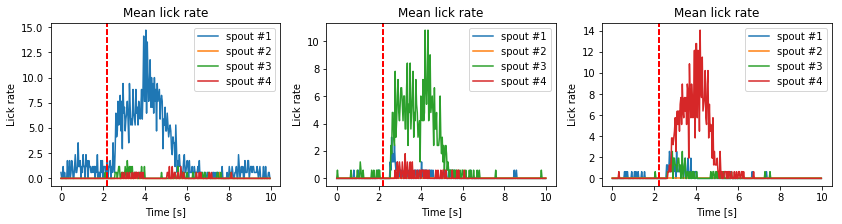

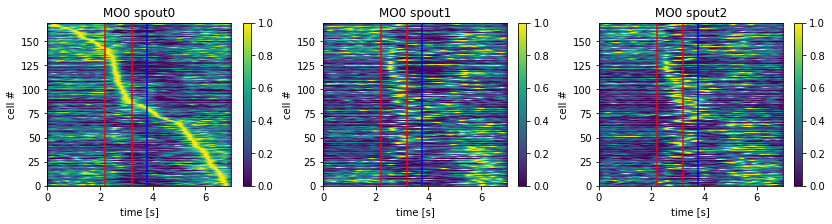

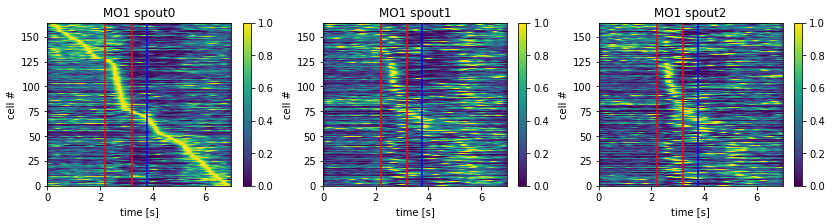

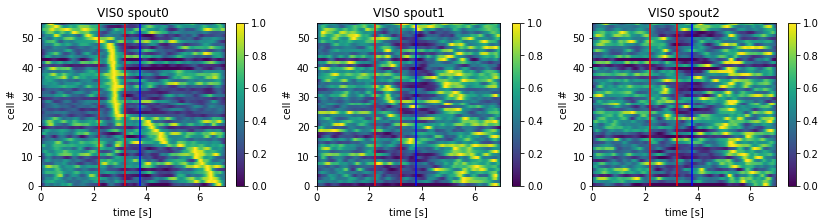

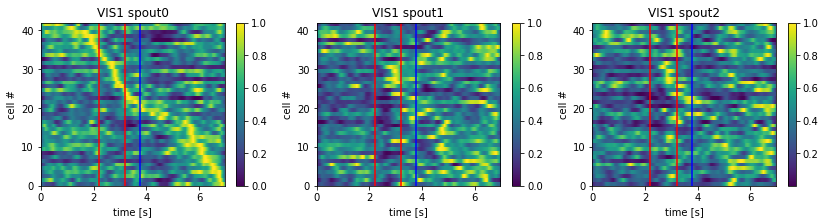

...

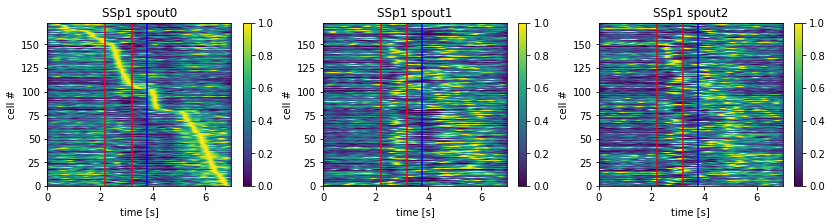

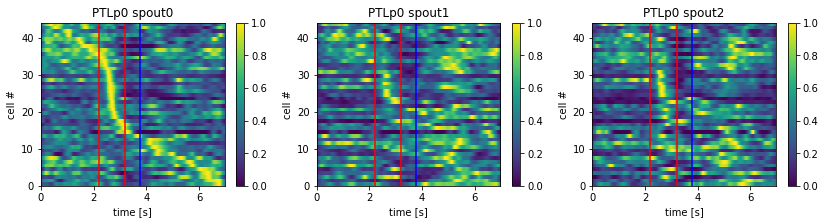

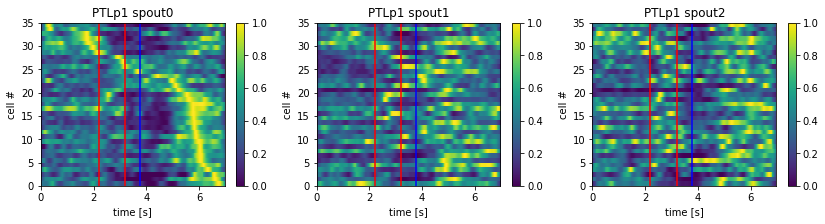

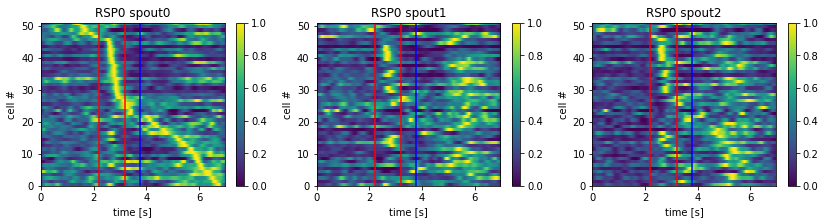

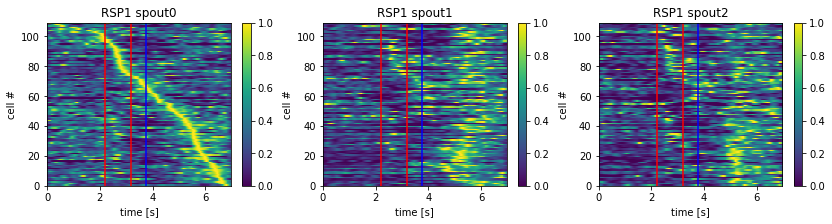

In [12]:
# Plot averaged rasters for each region, across each trial type
# Select cells and regions.
do_save = True


trial_sets = (lick_spout1, lick_spout3, lick_spout4)

plt.figure(figsize=(14,3))
BD.plot_mean_lick_rates(lick_spout1, ax=plt.subplot('131'))
BD.plot_mean_lick_rates(lick_spout3, ax=plt.subplot('132'))
BD.plot_mean_lick_rates(lick_spout4, ax=plt.subplot('133'))

if do_save:
    save_dir = os.path.join(CT.fig_save_path + '/trial_avgs/')
    if not os.path.isdir(save_dir):
        os.makedirs(save_dir)
    plt.savefig(save_dir + 'trial_avg_licks' + '.png' )

# Generate trial averages for specified trials and cells.
for region in ['MO', 'VIS', 'SSp', 'PTLp', 'RSP']:
    print(region)
    for hemisphere in [0, 1]:
        which_cells = np.array(CT.cells_in_region[CT.regions[region]])
        if hemisphere is not None:
            which_cells = which_cells[np.where(CT.hemisphere_of_cell[which_cells]
                                               ==hemisphere)[0]]
        plt.figure(figsize=(14,3))
        for ind, trials in enumerate(trial_sets):
            traces = CT.St_smooth[which_cells,:,:][:,:,np.where(trials[:-1])[0]]
            footprints = CT.footprints[:,:,which_cells]
            trial_means = np.mean(traces, axis=2)
            trial_sems = scipy.stats.sem(traces, axis=2)

            # Make plots.
            if ind == 0:
                ordering1 = utils.plot_average_trial_raster(trial_means, 
                                                        bpod_data=CT.bd, 
                                                        ordering='peak', 
                                                        do_normalize=True, 
                                                        dt = CT.dt,
                                                        ax=plt.subplot('13'+str(ind+1)), 
                                                        title=region+str(hemisphere)
                                                              +' spout'+str(ind))
            else:        
                utils.plot_average_trial_raster(trial_means, 
                                                bpod_data=CT.bd, 
                                                ordering=ordering1, # ordering='peak',
                                                do_normalize=True, 
                                                dt = CT.dt,
                                                ax=plt.subplot('13'+str(ind+1)), 
                                                title=region+str(hemisphere)
                                                      +' spout'+str(ind))
           
        if do_save:
            save_dir = os.path.join(CT.fig_save_path + '/trial_avgs/')
            if not os.path.isdir(save_dir):
                os.makedirs(save_dir)
            plt.savefig(save_dir + 'trial_avg_' + region + str(hemisphere) + '.png' )

In [13]:
# Find trial-type selective cells.

stim_frame = np.round(CT.fps*np.mean(CT.bd.stimulus_times)).astype(int)
reward_frame = np.round(stim_frame + 1.5*CT.fps).astype(int)

# frame_range = [stim_frame-30, stim_frame] # Set this.
frame_range = [stim_frame, stim_frame+60] 
# frame_range = [reward_frame+30, reward_frame+60] 
# frame_range = [stim_frame+30, stim_frame+44] 
do_include_nogo = False

if do_include_nogo:
    trial_sets = (lick_spout1, lick_spout3, lick_spout4, nolick)
else:
    trial_sets = (lick_spout1, lick_spout3, lick_spout4)


selection = utils.get_trial_type_selective_cells(CT.Ct,
                                                 frame_range,
                                                 trial_sets,
                                                 maxpval=1e-3,
                                                 post_hoc='maxdist')
good_cells = selection[0]
range_mean = selection[1]
range_sem = selection[2]
pvals = selection[3]
most_sig = selection[4]
sig_vals = selection[5]

---Plotting contours: 1.4964075088500977 seconds ---
---Plotting contours: 0.5866551399230957 seconds ---
---Plotting contours: 0.5283324718475342 seconds ---


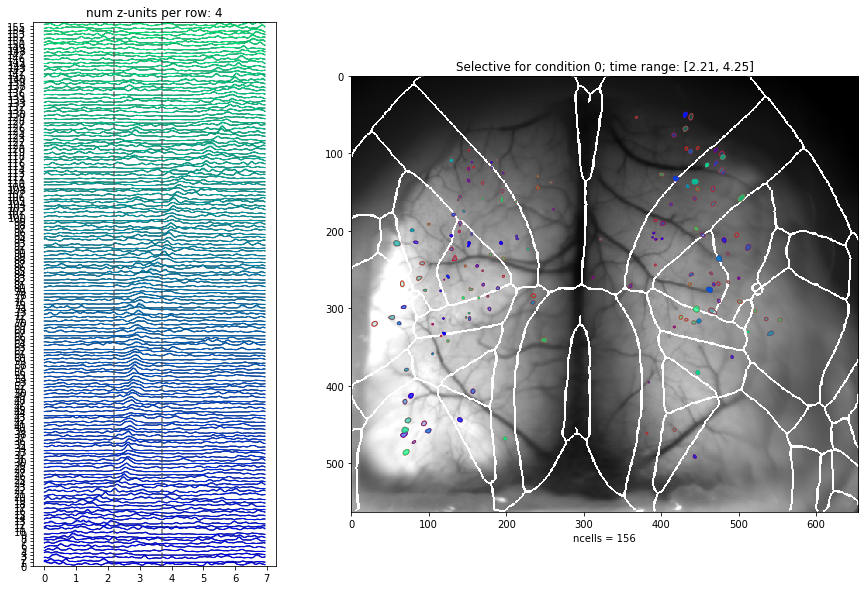

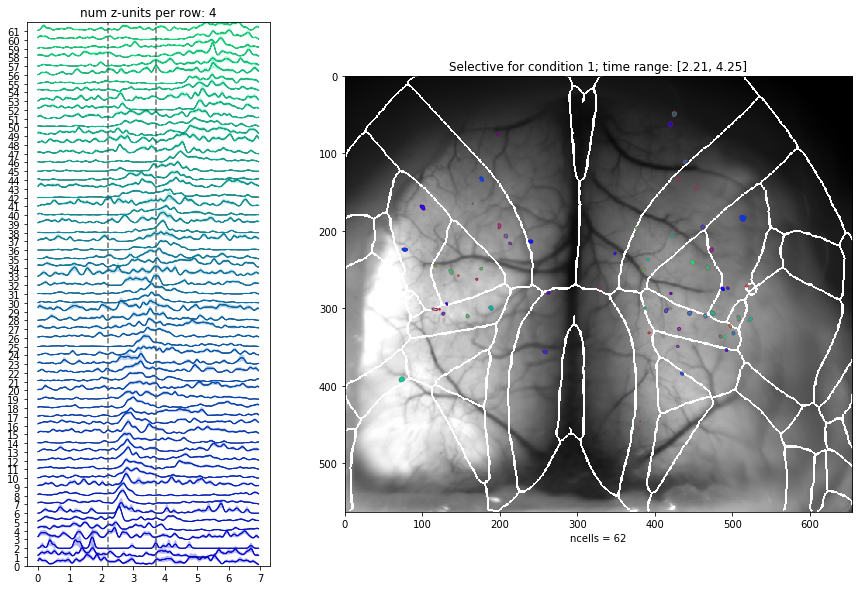

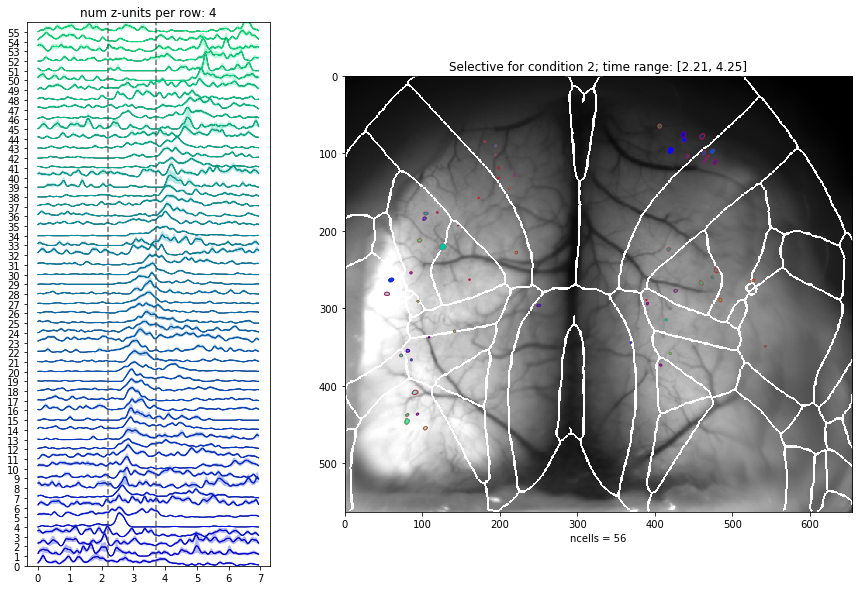

In [14]:
# Plot locations of the trial_selective cells.
# Are there trends in the spatial location of cells discriminative for each condition?
for condition in [0, 1, 2]:
    which_cells = good_cells[np.where(most_sig==condition)[0]]
    which_sig = sig_vals[np.where(most_sig == condition)[0]]
    trials = trial_sets[condition]

    # Generate trial averages for specified trials and cells.
#     traces = CT.Ct[which_cells,:,:][:,:,trials]
    traces = rates[which_cells,:,:][:,:,trials]
    footprints = CT.footprints[:,:,which_cells]
    trial_means = np.mean(traces, axis=2)
    trial_sems = scipy.stats.sem(traces, axis=2)

    alpha = which_sig/np.percentile(which_sig, 95)
    alpha[np.where(alpha>1)[0]] = 1
#     alpha = np.ones(np.shape(alpha))
    title = 'Selective for condition {}; time range: [{:.2f}, {:.2f}]'.format(condition,
                                                                           CT.Tt[frame_range[0]],
                                                                           CT.Tt[frame_range[1]])
    ordering = CT.plot_variance_shaded_traces(trial_means, trial_sems, 
                                              cell_inds=np.arange(0,len(which_cells)),
                                              footprints=footprints,
                                              ordering='peak', 
                                              title=title, 
                                              alpha=alpha) 

(655, 564)
---Plotting contours: 0.11070823669433594 seconds ---
(655, 564)
---Plotting contours: 0.09424614906311035 seconds ---
(655, 564)
---Plotting contours: 0.0870826244354248 seconds ---
(655, 564)
---Plotting contours: 0.12258124351501465 seconds ---
(655, 564)
---Plotting contours: 0.1770486831665039 seconds ---
(655, 564)
---Plotting contours: 0.20401382446289062 seconds ---
(655, 564)
---Plotting contours: 0.15449047088623047 seconds ---
(655, 564)
---Plotting contours: 0.18483877182006836 seconds ---
(655, 564)
---Plotting contours: 0.20372867584228516 seconds ---
(655, 564)
---Plotting contours: 0.13050246238708496 seconds ---
(655, 564)
---Plotting contours: 0.09253931045532227 seconds ---
(655, 564)
---Plotting contours: 0.10526418685913086 seconds ---
(655, 564)
---Plotting contours: 0.08975982666015625 seconds ---
(655, 564)
---Plotting contours: 0.09458041191101074 seconds ---
(655, 564)
---Plotting contours: 0.0914754867553711 seconds ---
(655, 564)
---Plotting conto

/home/user/anaconda3/envs/cosmostools3/lib/python3.6/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


(655, 564)
---Plotting contours: 0.08901643753051758 seconds ---
(655, 564)
---Plotting contours: 0.09758520126342773 seconds ---
(655, 564)
---Plotting contours: 0.11579465866088867 seconds ---
(655, 564)
---Plotting contours: 0.11896634101867676 seconds ---
(655, 564)
---Plotting contours: 0.15071630477905273 seconds ---
(655, 564)
---Plotting contours: 0.1535930633544922 seconds ---
(655, 564)
---Plotting contours: 0.13141560554504395 seconds ---
(655, 564)
---Plotting contours: 0.14067983627319336 seconds ---
(655, 564)
---Plotting contours: 0.14885425567626953 seconds ---
(655, 564)
---Plotting contours: 0.1351947784423828 seconds ---
(655, 564)
---Plotting contours: 0.13435673713684082 seconds ---
(655, 564)
---Plotting contours: 0.15344643592834473 seconds ---
(655, 564)
---Plotting contours: 0.11615204811096191 seconds ---
(655, 564)
---Plotting contours: 0.11442875862121582 seconds ---
(655, 564)
---Plotting contours: 0.1207728385925293 seconds ---
(655, 564)
---Plotting conto

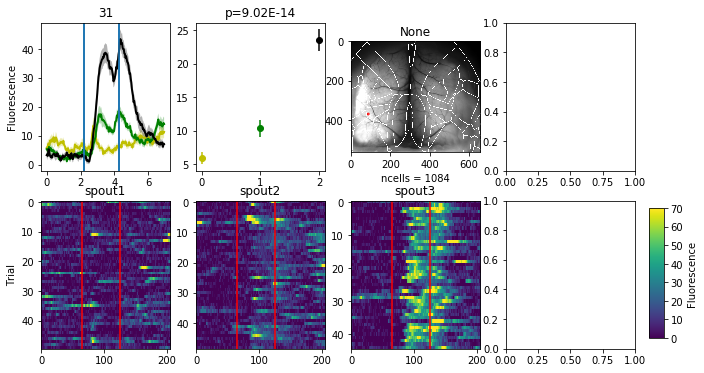

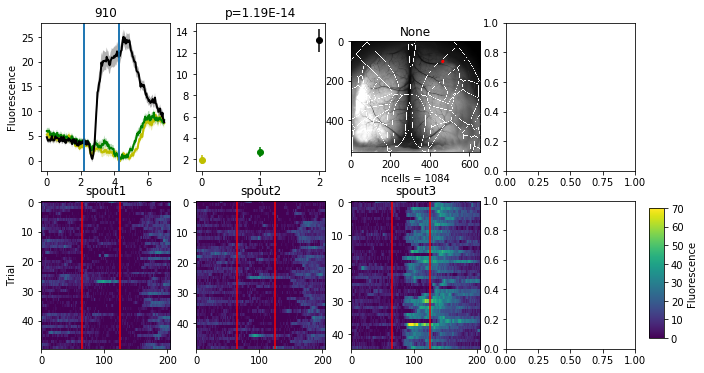

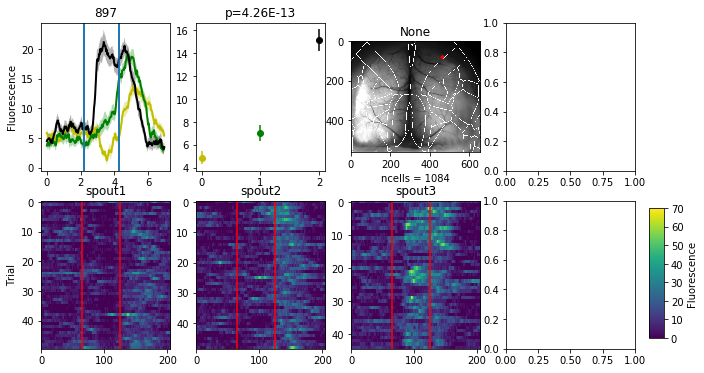

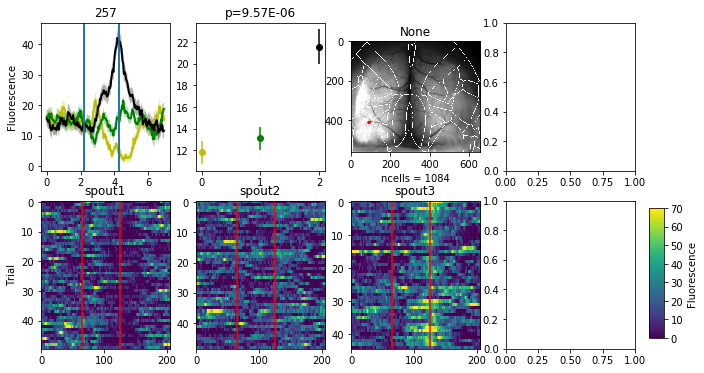

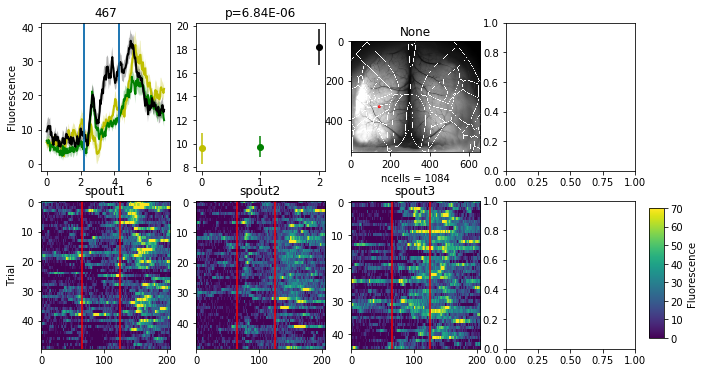

...

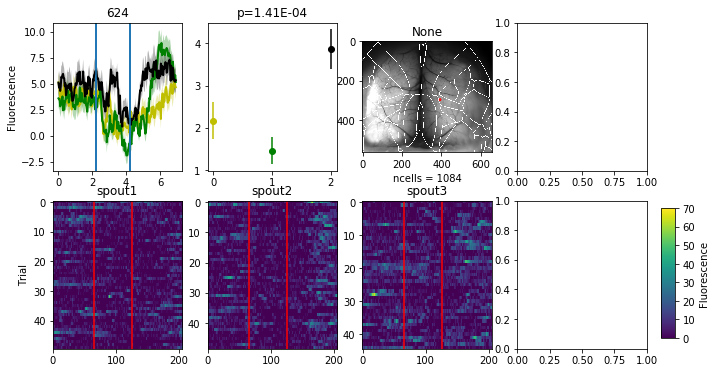

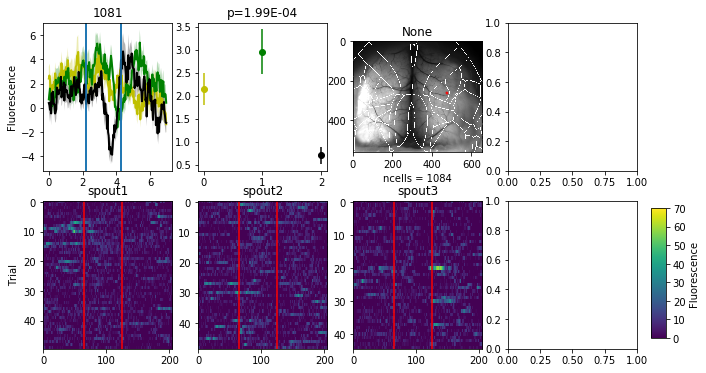

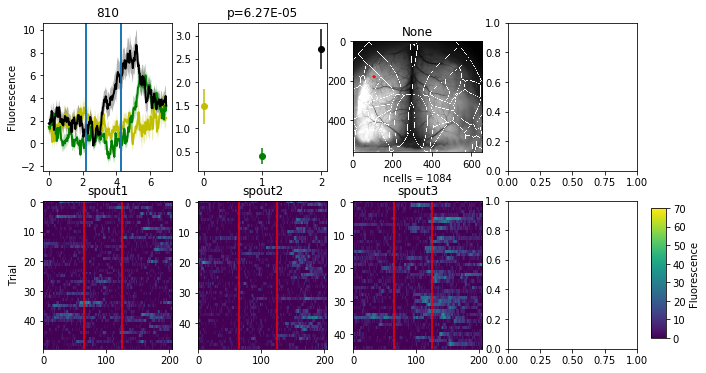

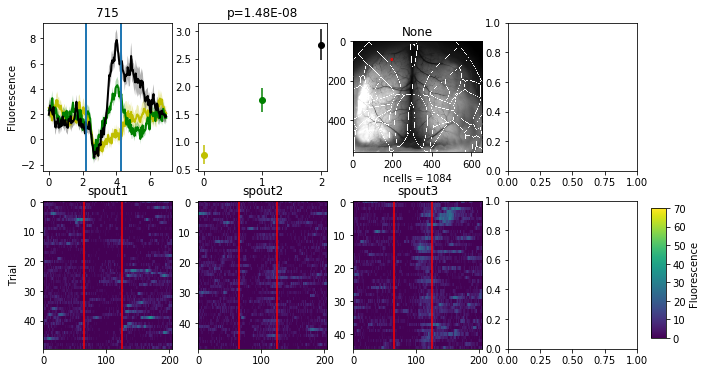

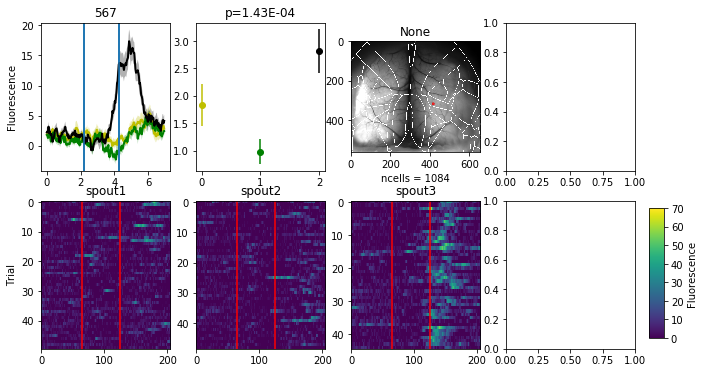

In [15]:
# For each cell, plot overlay of mean response to each of the conditions.

# Specify which cells to look at here.
condition = 2 ### Choose the trial type
which_cells = good_cells[np.where(most_sig == condition)[0]]
which_sig = sig_vals[np.where(most_sig == condition)[0]]

ordering = np.argsort(-which_sig)
which_cells = which_cells[ordering]
# which_cells = np.arange(400, 500)

cells = np.array(which_cells[0:100])

if do_include_nogo:
    names = ('spout1', 'spout2', 'spout3', 'nolick')
    colors = ('y', 'g', 'k', 'r')
else:
    names = ('spout1', 'spout2', 'spout3')
    colors = ('y', 'g', 'k')
    
for cell in cells:
    CT.plot_cell_across_trial_types(cell, frame_range, range_mean, range_sem,
                                    trial_sets, names, colors, pvals)

In [18]:
# Get distance matrix between sources. 
nneurons = rates.shape[0]
distances = np.zeros((nneurons, nneurons))
for neuron in range(nneurons):
    cc = CT.centroids[neuron,:]
    diff = CT.centroids - cc
    distances[neuron,:] = np.sqrt(diff[:, 0]**2 + diff[:, 1]**2)